In [1]:
import pandas as pd
import numpy as np
import random
from time import localtime
from time import gmtime, strftime
import time, datetime

C:\Users\huang\AppData\Local\Temp\ipykernel_11776\1054176390.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
file_name = 'Poltics_comments_200t(NLP_v1.4)' 
Poltics_dataframe = pd.read_csv('Data/' + file_name + '.csv',dtype={"text": 'string'})

C:\Users\huang\AppData\Local\Temp\ipykernel_11776\3476264976.py:2: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  Poltics_dataframe = pd.read_csv('Data/' + file_name + '.csv',dtype={"text": 'string'})


In [3]:
Poltics_dataframe.shape

(200002, 8)

In [4]:
## 清除掉三個政黨傾向皆為0的資料 減少之後計算負擔

Poltics_dataframe = Poltics_dataframe[(Poltics_dataframe['num1_poltics'] != 0) | (Poltics_dataframe['num2_poltics'] != 0) | (Poltics_dataframe['num3_poltics'] != 0)]

Poltics_dataframe = Poltics_dataframe.dropna(subset=['author','text'])
Poltics_dataframe = Poltics_dataframe.dropna()

Poltics_dataframe = Poltics_dataframe.sort_values(by=['author','time_parsed'], ascending=True)
Poltics_dataframe.reset_index(inplace=True)
Poltics_dataframe = Poltics_dataframe.drop(labels='index', axis=1)

In [5]:
Poltics_dataframe

,author,text,time_parsed,datatime,num1_poltics,num2_poltics,num3_poltics,num4_poltics
0,@---LIN-A---,我不是什麼粉...但不要看柯文哲好欺負，他有我們這些中立選民挺！❤假民調就算再低我也要投給他...,1702462583.452039,2023-12-13 10:16:23,1.0,0.0,0.0,0.0
1,@---ec6et,賴著不拆難道會加分嗎,1704946548.913008,2024-01-11 04:15:48,0.0,-1.0,0.0,0.0
2,@---oe9my,黃的話已經不可信了 柯P副手質疑美國籍時還要求徹查 ?? 我目前只聽郭正亮 民調真的只能...,1703299505.069216,2023-12-23 02:45:05,1.0,0.0,0.0,0.0
3,@---qq6iv,搶救王義川！ 全部動起來！,1702604237.62944,2023-12-15 01:37:17,0.0,1.0,0.0,0.0
4,@---we9nt,違建不拆整天哭爸 呵呵 你覺得公平就好😊,1703315723.372471,2023-12-23 07:15:23,0.0,-1.0,0.0,0.0
...,...,...,...,...,...,...,...,...
56532,@zzz-bv4er,我以前也是被洗腦😂自從柯P戳破疫苗美好泡泡之後我才清醒😂,1703284564.625154,2023-12-22 22:36:04,1.0,0.0,0.0,0.0
56533,@zzz-bv4er,希望柯文哲可以改變台灣不要再回到藍綠惡鬥了😊,1704177253.795692,2024-01-02 06:34:13,1.0,0.0,0.0,0.0
56534,@zzz-bv4er,阿北救人無數 怎麼藍綠壞事做盡還胡亂攻擊阿北😢 希望老天有眼 嚴懲惡黨,1704506520.032517,2024-01-06 02:02:00,1.0,-1.0,-1.0,0.0
56535,@zzzwohoya,抹黑被澄清以後業力引爆，國民黨必傷自身😂,1697979179.96552,2023-10-22 12:52:59,0.0,0.0,-1.0,0.0


In [6]:
Poltics_dataframe.shape

(56537, 8)

In [7]:
Author_list = [str(author) for author in Poltics_dataframe['author']]
Author_list = sorted(list(set(Author_list)))
Author_len = len(Author_list)

In [8]:
day_range = 100                                                                 # 設定日期長度
P100oltics = np.zeros([Author_len, day_range, 3], dtype=float)                  # 建立numpy [帳號數量, 日期數, 三個政黨傾向]
P100oltics_weighted = np.copy(P100oltics)                                       # 複製一個numpy 加權計算使用

In [9]:
for i in range(len(Poltics_dataframe)):
    author = Poltics_dataframe.loc[i,'author']
    author_index = Author_list.index(author)
    print('author index:', author_index, ' ', end='')
    print('Author:', author, ' ', end='')

    try:
      time_parsed = Poltics_dataframe.loc[i,'time_parsed']
      i_date = int((1705190400 - time_parsed) // 86400)                         # 找出每筆資料對應的日期, 1/13 選舉日定義為0 之後往前推100日
      print('i_date:', i_date, ' ' ,Poltics_dataframe.loc[i,'datatime'])
      if i_date < day_range:
        for i_num in range(3):
          P100oltics[author_index][i_date][i_num] += Poltics_dataframe.loc[i,'num'+ str(i_num+1) +'_poltics']
          P100oltics_weighted[author_index][i_date][i_num] += Poltics_dataframe.loc[i,'num'+ str(i_num+1) +'_poltics'] * (1 +(day_range-i_date)/100)
    except:
      print('error...')

author index: 0  Author: @---LIN-A---  i_date: 31   2023-12-13 10:16:23
author index: 1  Author: @---ec6et  i_date: 2   2024-01-11 04:15:48
author index: 2  Author: @---oe9my  i_date: 21   2023-12-23 02:45:05
author index: 3  Author: @---qq6iv  i_date: 29   2023-12-15 01:37:17
author index: 4  Author: @---we9nt  i_date: 21   2023-12-23 07:15:23
author index: 5  Author: @-.-aaa  i_date: 147   2023-08-19 05:37:37
author index: 5  Author: @-.-aaa  i_date: 86   2023-10-19 05:27:07
author index: 5  Author: @-.-aaa  i_date: 25   2023-12-19 06:10:19
author index: 5  Author: @-.-aaa  i_date: 25   2023-12-19 06:11:43
author index: 6  Author: @-Mchell-  i_date: 28   2023-12-16 14:25:24
author index: 7  Author: @-MichaelOne-  i_date: 82   2023-10-23 07:33:19
author index: 8  Author: @-Sam-jz1cn  i_date: 23   2023-12-21 23:02:53
author index: 8  Author: @-Sam-jz1cn  i_date: 23   2023-12-21 23:15:07
author index: 9  Author: @-_-skylar  i_date: 174   2023-07-23 08:36:51
author index: 9  Author: @-_-

In [10]:
P100oltics_Accumulation = np.copy(P100oltics_weighted)
for i_author in range(len(Author_list)):
    print("i_author:", i_author)
    for i_date in range(day_range,1,-1):
        P100oltics_Accumulation[i_author][i_date-2] += P100oltics_Accumulation[i_author][i_date-1]  #*(1 + (day_range-i_date)/100)

i_author: 0
i_author: 1
i_author: 2
i_author: 3
i_author: 4
i_author: 5
i_author: 6
i_author: 7
i_author: 8
i_author: 9
i_author: 10
i_author: 11
i_author: 12
i_author: 13
i_author: 14
i_author: 15
i_author: 16
i_author: 17
i_author: 18
i_author: 19
i_author: 20
i_author: 21
i_author: 22
i_author: 23
i_author: 24
i_author: 25
i_author: 26
i_author: 27
i_author: 28
i_author: 29
i_author: 30
i_author: 31
i_author: 32
i_author: 33
i_author: 34
i_author: 35
i_author: 36
i_author: 37
i_author: 38
i_author: 39
i_author: 40
i_author: 41
i_author: 42
i_author: 43
i_author: 44
i_author: 45
i_author: 46
i_author: 47
i_author: 48
i_author: 49
i_author: 50
i_author: 51
i_author: 52
i_author: 53
i_author: 54
i_author: 55
i_author: 56
i_author: 57
i_author: 58
i_author: 59
i_author: 60
i_author: 61
i_author: 62
i_author: 63
i_author: 64
i_author: 65
i_author: 66
i_author: 67
i_author: 68
i_author: 69
i_author: 70
i_author: 71
i_author: 72
i_author: 73
i_author: 74
i_author: 75
i_author: 76
i_author:

In [11]:
i_author = Author_list[random.randint(0,len(Author_list)-1)]
print(i_author)

print("Author_Index", Author_list.index(i_author))
for i in range(len(Poltics_dataframe)):
    if Poltics_dataframe.loc[i,'author'] == i_author:
        print(Poltics_dataframe.loc[i,'text'])
        print(Poltics_dataframe.loc[i,'num1_poltics'], Poltics_dataframe.loc[i,'num2_poltics'], Poltics_dataframe.loc[i,'num3_poltics'], end='')
        print('                                                        ',Poltics_dataframe.loc[i,'datatime'])
        print("-----------------------------------------------------------------------------------")

@hsiumichang732
Author_Index 8970
姓柯的當選總統是國家不幸
1.0 0.0 0.0                                                         2023-10-25 01:35:46
-----------------------------------------------------------------------------------
阿北的總統夢，賺大錢的夢
這下子，怎麼辦呀！
1.0 0.0 0.0                                                         2023-12-21 14:47:20
-----------------------------------------------------------------------------------


In [12]:
print(P100oltics[Author_list.index(i_author)])

[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [1. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [1. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0.

In [13]:
print(P100oltics_weighted[Author_list.index(i_author)])

[[0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [1.77 0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0. 

In [14]:
# np.save('P100oltics_Accumulation.npy', P100oltics_Accumulation)

In [15]:
print(P100oltics_Accumulation[Author_list.index(i_author)])

[[2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [2.97 0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0.   0.  ]
 [1.2  0. 

In [16]:
# 從三個政黨傾向中選出數值最大的代表 該作者的政黨傾向

Poltics_Pie = np.zeros([day_range, 4])                  # 正面的政治傾向
Hating_Pie = np.zeros([day_range, 4])                   # 反面的政治傾向
for i, i_author in enumerate(Author_list):
    print(i, 'author:', i_author)
    for i_day in range(day_range):
        author_index = Author_list.index(i_author)
        author_poltics = P100oltics_Accumulation[author_index][i_day]
        
        if len(np.where(author_poltics == max(author_poltics))[0]) == 1 :    # and max(author_poltics) > 0 
        # if len(np.where(author_poltics == max(author_poltics))[0]) == 1 and max(author_poltics) > 0 :    # and max(author_poltics) > 0 
            p_vote = np.where(author_poltics == max(author_poltics))[0][0]        
        else:p_vote = 3
        
        if len(np.where(author_poltics == min(author_poltics))[0]) == 1 :
        # if len(np.where(author_poltics == min(author_poltics))[0]) == 1 and min(author_poltics) < 0 :    # and max(author_poltics) > 0 
            h_vote = np.where(author_poltics == min(author_poltics))[0][0]  
        else:h_vote = 3
        
        print(p_vote, end='')
        Poltics_Pie[i_day][p_vote] += 1
        Hating_Pie[i_day][h_vote] += 1
    print('')   
    print('--------------------------------------------------------------------------')

0 author: @---LIN-A---
0000000000000000000000000000000033333333333333333333333333333333333333333333333333333333333333333333
--------------------------------------------------------------------------
1 author: @---ec6et
3333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333
--------------------------------------------------------------------------
2 author: @---oe9my
0000000000000000000000333333333333333333333333333333333333333333333333333333333333333333333333333333
--------------------------------------------------------------------------
3 author: @---qq6iv
1111111111111111111111111111113333333333333333333333333333333333333333333333333333333333333333333333
--------------------------------------------------------------------------
4 author: @---we9nt
3333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333333
--------------------------------------------------------------------------
5 author: @-.-aaa

In [17]:
print(Poltics_Pie)

[[1.4270e+04 1.7650e+03 5.6800e+02 1.5852e+04]
 [1.4129e+04 1.7090e+03 5.5800e+02 1.6059e+04]
 [1.4088e+04 1.7040e+03 5.5600e+02 1.6107e+04]
 [1.4060e+04 1.7020e+03 5.5700e+02 1.6136e+04]
 [1.4027e+04 1.7010e+03 5.5700e+02 1.6170e+04]
 [1.3982e+04 1.6920e+03 5.5700e+02 1.6224e+04]
 [1.3932e+04 1.6900e+03 5.5700e+02 1.6276e+04]
 [1.3894e+04 1.6850e+03 5.5800e+02 1.6318e+04]
 [1.3782e+04 1.6790e+03 5.5600e+02 1.6438e+04]
 [1.3456e+04 1.6260e+03 5.0500e+02 1.6868e+04]
 [1.3438e+04 1.6230e+03 5.0200e+02 1.6892e+04]
 [1.3434e+04 1.6200e+03 5.0200e+02 1.6899e+04]
 [1.3352e+04 1.6070e+03 4.9400e+02 1.7002e+04]
 [1.3311e+04 1.6040e+03 4.9200e+02 1.7048e+04]
 [1.3309e+04 1.6030e+03 4.9200e+02 1.7051e+04]
 [1.2963e+04 1.5800e+03 4.8200e+02 1.7430e+04]
 [1.2746e+04 1.5320e+03 4.7700e+02 1.7700e+04]
 [1.2636e+04 1.5170e+03 4.6700e+02 1.7835e+04]
 [1.2636e+04 1.5120e+03 4.6700e+02 1.7840e+04]
 [1.2556e+04 1.5030e+03 4.6200e+02 1.7934e+04]
 [1.2466e+04 1.4660e+03 4.5600e+02 1.8067e+04]
 [1.2457e+04 

In [18]:
print(Poltics_Pie[0])
print(Hating_Pie[0])

[14270.  1765.   568. 15852.]
[ 1712.  6197.  9486. 15060.]


In [19]:
import datetime 

Day0 = datetime.date(2024, 1, 13)
Date_all = [Day0 - datetime.timedelta(days=i) for i in range(day_range)]
Date_all.reverse()

In [20]:
np.flip(Poltics_Pie[:,0])

array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 7.0000e+00, 1.6000e+01, 4.3000e+01,
       2.4300e+02, 2.4300e+02, 2.4300e+02, 4.4200e+02, 6.5700e+02,
       7.3500e+02, 1.2400e+03, 1.4510e+03, 1.4510e+03, 1.5090e+03,
       1.5200e+03, 1.5200e+03, 1.5200e+03, 1.5200e+03, 1.6620e+03,
       1.6620e+03, 1.6620e+03, 1.6620e+03, 1.6620e+03, 1.6620e+03,
       1.9230e+03, 1.9230e+03, 1.9230e+03, 1.9230e+03, 1.9230e+03,
       1.9230e+03, 1.9230e+03, 1.9230e+03, 1.9420e+03, 1.9440e+03,
       1.9880e+03, 2.3380e+03, 2.3380e+03, 2.3440e+03, 2.5790e+03,
       3.0210e+03, 3.7890e+03, 4.5770e+03, 5.0230e+03, 5.0230e+03,
       5.1070e+03, 5.1450e+03, 5.1450e+03, 5.2020e+03, 5.2020e+03,
       5.5090e+03, 5.5090e+03, 5.5090e+03, 5.5090e+03, 5.5090e+03,
       6.1920e+03, 6.1920e+03, 6.1920e+03, 6.1920e+03, 6.1920e+03,
       6.1920e+03, 6.1920e+03, 6.1920e+03, 6.4300e+03, 6.4800e+03,
       7.0100e+03, 7.5960e+03, 7.5960e+03, 7.6030e+03, 8.2450e

In [21]:
P100oltics_dataframe = pd.DataFrame({'Date':Date_all,'TPP':np.flip(Poltics_Pie[:,0]), 'DPP':np.flip(Poltics_Pie[:,1]),'KMT':np.flip(Poltics_Pie[:,2]), 'Neutral':np.flip(Poltics_Pie[:,3])})      
H100ating_dataframe = pd.DataFrame({'Date':Date_all,'TPP':np.flip(Hating_Pie[:,0]), 'DPP':np.flip(Hating_Pie[:,1]), 'KMT':np.flip(Hating_Pie[:,2]), 'Neutral':np.flip(Hating_Pie[:,3])})        

In [22]:
print(P100oltics_dataframe.head())
print(H100ating_dataframe.head())

         Date  TPP  DPP  KMT  Neutral
0  2023-10-06  0.0  0.0  0.0  32455.0
1  2023-10-07  0.0  0.0  0.0  32455.0
2  2023-10-08  0.0  0.0  0.0  32455.0
3  2023-10-09  0.0  0.0  0.0  32455.0
4  2023-10-10  0.0  0.0  0.0  32455.0
         Date  TPP  DPP  KMT  Neutral
0  2023-10-06  0.0  0.0  0.0  32455.0
1  2023-10-07  0.0  0.0  0.0  32455.0
2  2023-10-08  0.0  0.0  0.0  32455.0
3  2023-10-09  0.0  0.0  0.0  32455.0
4  2023-10-10  0.0  0.0  0.0  32455.0


In [23]:
def func(s,np_array):
  t = int(round(s/100.*sum(np_array)))     # 透過百分比反推原本的數值
  return f'{s:.1f}%'     # 使用文字格式化的方式，顯示內容

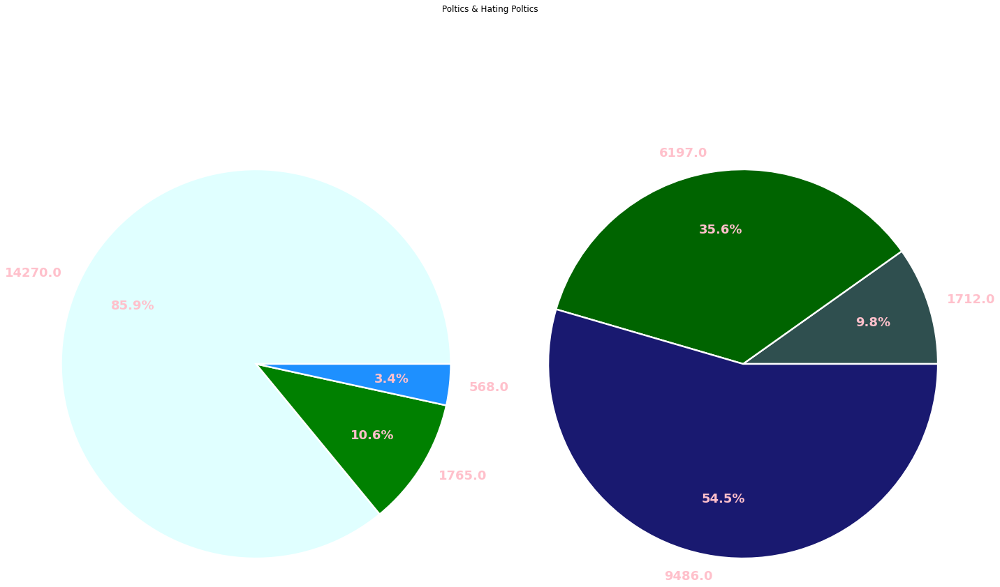

In [24]:
from matplotlib import pyplot as plt

poltics_x = np.delete(Poltics_Pie[0], 3)
hating_x = np.delete(Hating_Pie[0], 3)


# fig, ax = plt.subplots()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
plt.subplots_adjust(wspace=4)
fig.suptitle('Poltics & Hating Poltics')

poltics_color = ['#E0FFFF','#008000','#1E90FF','#FFFFFF']
ax1.pie(poltics_x,
        colors=poltics_color,
        radius=5,
        textprops={'color':'#FFC0CB', 'weight':'bold', 'size':18},
        pctdistance=0.7,
        labels=poltics_x,
        autopct=lambda i: func(i,poltics_x),
        wedgeprops={'linewidth':2.4,'edgecolor':'w'})



hating_color = ['#2F4F4F','#006400','#191970','#FFFFFF']
ax2.pie(hating_x,
        colors=hating_color,
        radius=5,
        textprops={'color':'#FFC0CB', 'weight':'bold', 'size':18},
        pctdistance=0.7,
        labels=hating_x,
        autopct=lambda i: func(i,poltics_x),
        wedgeprops={'linewidth':2.4,'edgecolor':'w'})
plt.show()

In [25]:
# 中立的帳戶站超過一半以上 影響最後數據化呈現 因此把多餘的清除掉

P100oltics_total = P100oltics_dataframe.loc[99, 'TPP'] + P100oltics_dataframe.loc[99, 'DPP'] + P100oltics_dataframe.loc[99, 'KMT']
H100ating_total = H100ating_dataframe.loc[99, 'TPP'] + H100ating_dataframe.loc[99, 'DPP'] + H100ating_dataframe.loc[99, 'KMT']

for i in range(len(P100oltics_dataframe)):
    P100oltics_dataframe.loc[i, 'Neutral'] = P100oltics_total - P100oltics_dataframe.loc[i, 'TPP'] - P100oltics_dataframe.loc[i, 'DPP'] - P100oltics_dataframe.loc[i, 'KMT']
    H100ating_dataframe.loc[i, 'Neutral'] = H100ating_total - H100ating_dataframe.loc[i, 'TPP'] - H100ating_dataframe.loc[i, 'DPP'] - H100ating_dataframe.loc[i, 'KMT']

In [26]:
P100oltics_dataframe.to_excel('Data/' + file_name.replace('Poltics_comments','100Day_Poltics') + '.xlsx', index=False)
H100ating_dataframe.to_excel('Data/' + file_name.replace('Poltics_comments','100Day_Hating') + '.xlsx', index=False)